# Регрессия

# Автор: [Олег Булыгин](https://olegtalks.ru/)

<div style="background-color: #f5f5f5; border-left: 5px solid #3498db; padding: 10px; margin: 10px 0;">

## Обо мне

🐍 **Эксперт по Python и Data Science**. В 2020 году ушёл из найма, сейчас реализую собственные проекты, занимаюсь IT-образованием и консультированием.

👨‍💻 **Опыт в образовании**. В IT-образовании с 2017 года. За это время провел более 1500 лекций и вебинаров, обучил тысячи студентов, многие из которых сейчас работают в ведущих IT-компаниях. Создаю авторские курсы, консультирую крупные компании по вопросам Data Science и участвую в разработке образовательных программ для университетов и онлайн-школ.

🎯 Стремлюсь сделать обучение качественным и честным для всех, кто хочет развиваться в IT-сфере.

📱 Делюсь полезными материалами о Python:
- [Telegram](https://t.me/pythontalk)
- [Дзен](https://dzen.ru/pythontalk)
</div>


In [ ]:
# !pip install phik


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.7/679.7 kB 22.5 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.linear_model import LinearRegression, ElasticNet
import numpy as np
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import r2_score
from sklearn.model_selection import cross_validate, KFold, train_test_split
from sklearn.pipeline import make_pipeline
# !pip install phik
import phik
from phik.report import plot_correlation_matrix

In [ ]:
from sklearn.datasets import fetch_openml

data = fetch_openml(name='house_sales')
print(data.DESCR)

**Author**: https://www.kaggle.com/harlfoxem/  
https://www.kaggle.com/harlfoxem/  
**Source**: [original](https://www.kaggle.com/harlfoxem/housesalesprediction) - 2016-08-25  
**Please cite**:   

This dataset contains house sale prices for King County, which includes Seattle. It includes homes sold between May 2014 and May 2015.

It contains 19 house features plus the price and the id columns, along with 21613 observations.
It's a great dataset for evaluating simple regression models.

* Id: Unique ID for each home sold
* Date: Date of the home sale
* Price: Price of each home sold
* Bedrooms: Number of bedrooms
* Bathrooms: Number of bathrooms, where .5 accounts for a room with a toilet but no shower
* Sqft_living: Square footage of the apartments interior living space
* Sqft_lot: Square footage of the land space
* Floors: Number of floors
* Waterfront: A dummy variable for whether the apartment was overlooking the waterfront or not
* View: An index from 0 to 4 of how good the view 

/usr/local/lib/python3.12/dist-packages/sklearn/datasets/_openml.py:323: UserWarning: Multiple active versions of the dataset matching the name house_sales exist. Versions may be fundamentally different, returning version 1. Available versions:
- version 1, status: active
  url: https://www.openml.org/search?type=data&id=42079
- version 2, status: active
  url: https://www.openml.org/search?type=data&id=42092

  warn(warning_msg)


In [ ]:
df = data.data.drop(['date', 'zipcode', 'lat', 'long', 'yr_renovated'], axis=1)
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,sqft_living15,sqft_lot15
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,1955,1340,5650
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,1951,1690,7639
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,1933,2720,8062
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,1965,1360,5000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,1987,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,2009,1530,1509
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,2014,1830,7200
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,2009,1020,2007
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,2004,1410,1287


In [ ]:
# !pip install ydata_profiling

In [ ]:
from ydata_profiling import ProfileReport

profile = ProfileReport(df, title="Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]


100%|██████████| 15/15 [00:00<00:00, 43.16it/s]


Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

interval columns not set, guessing: ['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade', 'sqft_above', 'sqft_basement', 'yr_built', 'sqft_living15', 'sqft_lot15']


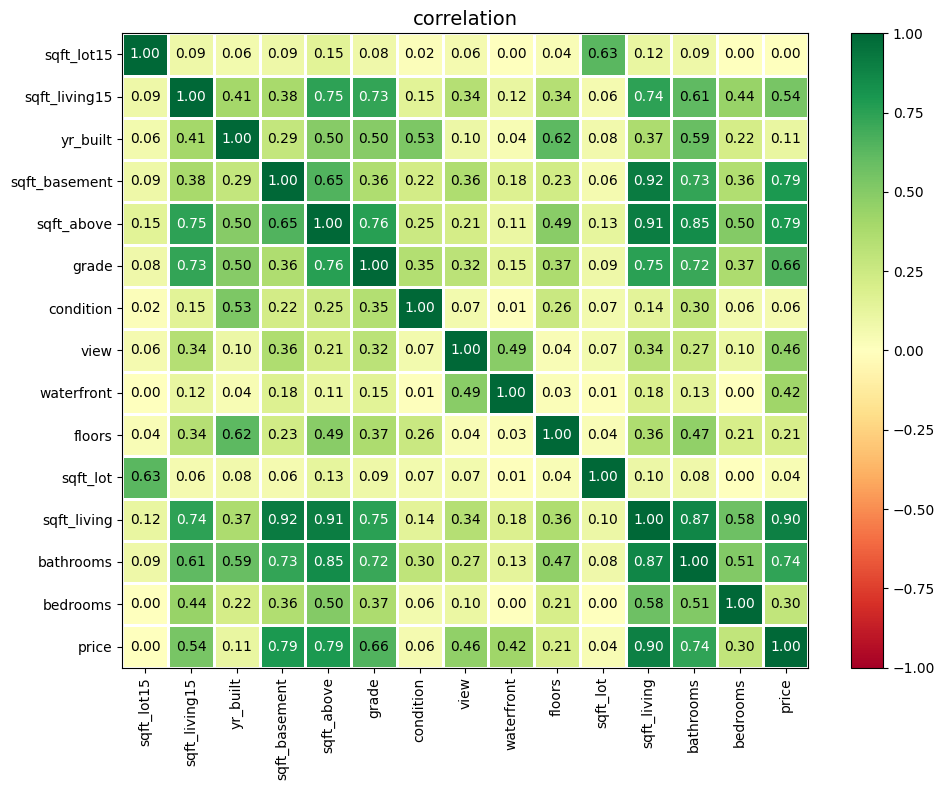

In [ ]:
corr_matrix = df.phik_matrix()
plot_correlation_matrix(corr_matrix.values, x_labels=corr_matrix.columns, y_labels=corr_matrix.index, figsize=(10, 8))

Видим, что между двумя признаками оказалась высокая корреляция.

Что тут можно сделать?
- Удалить один признак из такой пары:
- Попробовать применить **регуляризацию**.






 Если мы используем регуляризацию, то масштабирование признаков становится ещё более важным. Регуляризация накладывает штрафы на величины коэффициентов, и если признаки не отмасштабированы, модель может неправильно оценивать их важность.



In [ ]:
X_train, X_test, y_train, y_test = train_test_split(df.drop('price', axis=1),
                                                    df['price'],
                                                    random_state=42)

Для начала создадим обычную модель без полиномиальных признаков, чтобы сравнивать качество с ней.


## Пайплайны

Обратите внимание, что если мы осушествляем любой feature engineering, это должно происходить отдельно для каждой из итераций и каждый раз только на соответствующей обучающей выборке.
В нашем случае параметры масштабирования (среднее и стандартное отклонение) пассчитывались на всём `X_train`, а данные в каждом валидационном фолде уже масштабированы с использованием параметров, рассчитанных на `X_train`.
Это нарушает принцип кросс-валидации, так как валидационные данные (часть `X_train`, выделенная в каждом фолде) уже "знают" информацию о тренировочных данных, из которых были рассчитаны параметры масштабирования.

Таким, образом модель как бы "подглядывает" данные из трейна при оценке на валидации.

В sklearn для решения этой проблемы есть класс `Pipeline` и функция `make_pipeline`: в нём можно перечислить шаги работы с данными вплоть до применения модели.

In [ ]:
# Создаем пайплайн
pipeline = make_pipeline(StandardScaler(), LinearRegression())

# Обучаем пайплайн
pipeline.fit(X_train, y_train)

# Создаем KFold
kf = KFold(n_splits=3, shuffle=True, random_state=42)

# Выполняем кросс-валидацию
cv_metrics = cross_validate(
    estimator=pipeline,
    X=X_train,
    y=y_train,
    cv=kf,
    scoring='r2',
    return_train_score=True,
    n_jobs=-1
)


Посмотреть на результат всех преобразованйи можно так:

Берем срез `[:-1]`, чтобы исключить последний шаг пайплайна, который  является моделью (LinearRegression).

In [ ]:
X_train_transformed = pipeline[:-1].transform(X_train)
X_train_transformed_df = pd.DataFrame(X_train_transformed, columns=X_train.columns)
X_train_transformed_df

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,sqft_living15,sqft_lot15
0,0.677402,0.178963,-0.290276,-0.144952,0.922943,-0.083788,-0.306964,-0.626000,-0.557611,0.030720,-0.657843,-0.345663,-0.473911,-0.129791
1,-0.394132,0.505667,-0.521813,-0.311135,0.922943,-0.083788,-0.306964,0.908842,-0.557611,-0.224818,-0.657843,0.709771,-0.385919,-0.339019
2,0.677402,0.505667,-0.389506,-0.160457,0.922943,-0.083788,-0.306964,-0.626000,0.296350,-0.078796,-0.657843,0.777864,-0.165941,-0.196068
3,-1.465666,0.178963,-0.918734,-0.364787,0.922943,-0.083788,-0.306964,-0.626000,-0.557611,-0.772399,-0.452638,1.288558,-1.089851,-0.445025
4,-0.394132,-0.147741,-0.874632,-0.038936,-0.918626,-0.083788,-0.306964,-0.626000,-0.557611,-0.614209,-0.657843,0.777864,-0.576568,-0.173196
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,-0.394132,-0.801150,-1.183348,-0.204862,-0.918626,-0.083788,-0.306964,-0.626000,-0.557611,-0.954927,-0.657843,-0.822311,-1.441817,-0.214930
16205,-0.394132,0.505667,1.117691,-0.254109,0.922943,-0.083788,-0.306964,-0.626000,0.296350,1.584635,-0.657843,1.458789,1.384176,-0.280428
16206,-0.394132,0.505667,0.051517,-0.259827,0.922943,-0.083788,-0.306964,-0.626000,-0.557611,0.407943,-0.657843,1.118326,-0.429915,-0.374478
16207,-2.537201,-1.781262,-1.866934,0.003408,-0.918626,-0.083788,-0.306964,-0.626000,-2.265534,-1.709372,-0.657843,-0.277571,-1.192508,0.084078


И оцениваем качество:

In [ ]:
print(f"Среднее качество на тренировочной выборке: {cv_metrics['test_score'].mean()}")
print(f"Среднее качество на валидации: {cv_metrics['test_score'].mean()}")

Среднее качество на тренировочной выборке: 0.6496995178550432
Среднее качество на валидации: 0.6496995178550432


При использовании пайпланой в каждой итерации кросс-валидации `StandardScaler` будет вычислять параметры масштабирования (среднее и стандартное отклонение) только на текущих тренировочных фолдах и применять их к текущим валидационным фолдам.

Это гарантирует, что тренировочные данные не будут "подглядывать" информацию из валидационных данных за пределами текущего фолда, что обеспечивает честную оценку модели.

## Полиномиальная регрессия



Полиномиальная регрессия (Polynomial Regression) — это более сложная модель, чем линейная регрессия. Вместо уравнения прямой используется уравнение полинома (многочлена), который отражает нелинейную зависимость. Степень полинома может быть сколь угодно большой: чем больше степень, тем сложнее модель.

В простом двумерном случае, когда мы рассматриваем зависимость целевого признака от одного фактора, полиномом второй степени будет уравнение параболы:

$$y = k_1 x + k_2 x^2 + b$$



Геометрически полином в двумерном пространстве — это некоторая кривая, которая пытается описать зависимость в данных. Выглядит это следующим образом:



Благодаря степенным слагаемым модель становится сложнее и начинает улавливать более сложные зависимости и выдавать меньшее смещение.

При реализации полиномиальной регрессии стоит проводить масштабирование **перед** генерацией полиномиальных признаков.

Это улучшает качество модели и обеспечивает более стабильные результаты при обучении.

Если делать масштабирование после создания полиномов, то:

- значения новых признаков могут значительно варьироваться. Стандартизация этих полиномов может сделать интерпретацию коэффициентов модели более сложной, так как значения полиномов уже изменены и не соответствуют исходным данным. Это затрудняет понимание того, как каждый признак влияет на зависимую переменную.

- модель станет более чувствительной к выбросам и шуму в данных. Поскольку полиномиальные признаки могут иметь большие значения, их стандартизация может не устранить проблемы переобучения, а наоборот, усугубить их, так как модель будет пытаться подстроиться под измененные масштабы.


In [ ]:
from sklearn.preprocessing import PolynomialFeatures

pipeline = make_pipeline(StandardScaler(),
                         PolynomialFeatures(degree=2, include_bias=False),
                         LinearRegression())

Посмотрим, как будут выглядеть тренировочные данные после преобразования в `pipeline`:

In [ ]:
pipeline.fit(X_train, y_train)

X_train_transformed = pipeline[:-1].transform(X_train)

# так мы получаем имена столбцов с полиномами
poly_feature_names = pipeline.named_steps['polynomialfeatures'].get_feature_names_out(input_features=X_train.columns)

X_train_transformed_df = pd.DataFrame(X_train_transformed, columns=poly_feature_names)

X_train_transformed_df

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,...,sqft_basement^2,sqft_basement yr_built,sqft_basement sqft_living15,sqft_basement sqft_lot15,yr_built^2,yr_built sqft_living15,yr_built sqft_lot15,sqft_living15^2,sqft_living15 sqft_lot15,sqft_lot15^2
0,0.677402,0.178963,-0.290276,-0.144952,0.922943,-0.083788,-0.306964,-0.626000,-0.557611,0.030720,...,0.432757,0.227392,0.311759,0.085382,0.119483,0.163814,0.044864,0.224591,0.061509,0.016846
1,-0.394132,0.505667,-0.521813,-0.311135,0.922943,-0.083788,-0.306964,0.908842,-0.557611,-0.224818,...,0.432757,-0.466918,0.253874,0.223021,0.503775,-0.273914,-0.240626,0.148934,0.130834,0.114934
2,0.677402,0.505667,-0.389506,-0.160457,0.922943,-0.083788,-0.306964,-0.626000,0.296350,-0.078796,...,0.432757,-0.511712,0.109163,0.128982,0.605072,-0.129079,-0.152514,0.027536,0.032536,0.038443
3,-1.465666,0.178963,-0.918734,-0.364787,0.922943,-0.083788,-0.306964,-0.626000,-0.557611,-0.772399,...,0.204881,-0.583250,0.493308,0.201435,1.660381,-1.404336,-0.573441,1.187776,0.485012,0.198048
4,-0.394132,-0.147741,-0.874632,-0.038936,-0.918626,-0.083788,-0.306964,-0.626000,-0.557611,-0.614209,...,0.432757,-0.511712,0.379291,0.113936,0.605072,-0.448491,-0.134723,0.332430,0.099859,0.029997
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16204,-0.394132,-0.801150,-1.183348,-0.204862,-0.918626,-0.083788,-0.306964,-0.626000,-0.557611,-0.954927,...,0.432757,0.540951,0.948489,0.141390,0.676196,1.185622,0.176740,2.078837,0.309890,0.046195
16205,-0.394132,0.505667,1.117691,-0.254109,0.922943,-0.083788,-0.306964,-0.626000,0.296350,1.584635,...,0.432757,-0.959654,-0.910570,0.184477,2.128065,2.019221,-0.409085,1.915944,-0.388161,0.078640
16206,-0.394132,0.505667,0.051517,-0.259827,0.922943,-0.083788,-0.306964,-0.626000,-0.557611,0.407943,...,0.432757,-0.735683,0.282817,0.246348,1.250654,-0.480785,-0.418789,0.184827,0.160994,0.140234
16207,-2.537201,-1.781262,-1.866934,0.003408,-0.918626,-0.083788,-0.306964,-0.626000,-2.265534,-1.709372,...,0.432757,0.182598,0.784483,-0.055310,0.077046,0.331006,-0.023338,1.422075,-0.100264,0.007069


In [ ]:
kf = KFold(3, shuffle=True, random_state=42)

cv_metrics = cross_validate(
    estimator=pipeline,
    X=X_train,
    y=y_train,
    cv=kf,
    scoring='r2',
    return_train_score=True,
    n_jobs=-1
)
cv_metrics

{'fit_time': array([0.31120133, 0.26688194, 0.13451815]),
 'score_time': array([0.0179565 , 0.02644753, 0.01375914]),
 'test_score': array([0.73937992, 0.73664428, 0.7176041 ]),
 'train_score': array([0.74712052, 0.75399699, 0.75953304])}

In [ ]:
print(f"Среднее качество на тренировочной выборке: {cv_metrics['train_score'].mean()}")
print(f"Среднее качество на валидационной выборке: {cv_metrics['test_score'].mean()}")

Среднее качество на тренировочной выборке: 0.7535501811785542
Среднее качество на валидационной выборке: 0.7312094342349044


## Регуляризация

Методы регуляризации работают путем добавления штрафных коэффициентов к исходной функции потерь модели таким образом, что высокие значения коэффициентов снижаются. А признаки с очень низкими значениями коэффициентов (после штрафования) могут быть вообще отброшены. Это помогает уменьшать сложность модели, а также **снижает риск переобучения** путём уменьшения сложности модели.

**Штраф** — это дополнительное неотрицательное слагаемое в выражении для функции потерь, которое специально повышает ошибку.  За счёт этого слагаемого метод оптимизации будет находить не истинный минимум функции потерь, а псевдоминимум.

Существует множество методов регуляризации, из которых мы обсудим три наиболее часто используемых, а именно: Rigde, Lasso и Elastic Net.



Регуляризация Elastic Net сочетает в себе преимущества Lasso и Ridge-регуляризации в одной инструменте.

Функция потерь имеет два важных гиперпараметра: `alpha` и `l1_ratio`. Альфа в случае регуляризации Elastic Net — это константа, которая умножается на штрафы и для L1 (Lasso), и для L2 (Ridge). Гиперпараметр `l1_ratio` называется параметром смешивания таким образом, что `0 <= l1_ratio <= 1`.
Когда `l1_ratio` равен 1, это означает, что доля L1 (Lasso) равна 100%, а доля L2 (Ridge) равна 0%, то есть по факту просто делается Lasso-регуляризация. Аналогично, когда `l1_ratio` равно 0, это то же самое, что обычная Ridge-регуляризация.

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

pipeline = make_pipeline(StandardScaler(),
                         PolynomialFeatures(degree=2, include_bias=False),
                         ElasticNet(random_state=42))

param_dist = {
    'elasticnet__alpha': np.linspace(0, 2000, 10),
    'elasticnet__l1_ratio': np.linspace(0, 1, 10)
}

random_search = RandomizedSearchCV(pipeline,
                                   param_distributions=param_dist,
                                   scoring='r2',
                                   n_iter=10,
                                   n_jobs=-1,
                                   cv=kf,
                                   random_state=42)

random_search.fit(X_train, y_train)

print(f"Наилучшее значение R2 при кросс-валидации: {random_search.best_score_}")
print(f"Наилучшие значения параметров: {random_search.best_params_}")

Наилучшее значение R2 при кросс-валидации: 0.7353754853046329
Наилучшие значения параметров: {'elasticnet__l1_ratio': np.float64(1.0), 'elasticnet__alpha': np.float64(666.6666666666667)}


Оценим лучший результат на тесте:

In [ ]:
# Предсказываем значения
y_pred_enet = random_search.predict(X_test)

# Рассчитываем коэффициент детерминации
print(f"R^2 на тестовых данных: {r2_score(y_test, y_pred_enet)}")